<a href="https://colab.research.google.com/github/emish8/Converting-Photos-to-Monet-Style-Paintings-Using-GANs/blob/main/Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Neural Style Transfer
Style transfer is a computer vision technique that takes two images—a content image and a style reference image—and blends them together so that the resulting output image retains the core elements of the content image, but appears to be “painted” in the style of the style reference image.

reference: https://www.tensorflow.org/tutorials/generative/style_transfer#build_the_model

# Importing Dependencies

In [ ]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [ ]:
import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools
import cv2

# Downloading Data From Kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# folder path for dataset
Artit_path = "/content/drive/MyDrive/small_proj/Udin"
photos_path = "/content/drive/MyDrive/small_proj/Klag"

No. of images in jpg format: 724


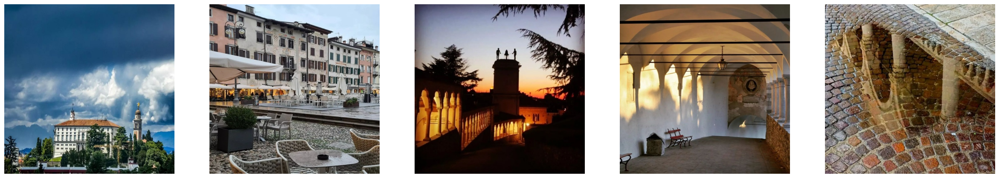

In [ ]:

import glob
import cv2

# Read all jpg files in the folder
def read_filenames(path):
    path = os.path.join(path, '*.jpg')
    names = glob.glob(path)
    return names

# Read images from local
def read_img(path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

# Display Sample from dataset
def display_image(num, row, filenames, figsize=(20, 20)):
    plt.figure(figsize=figsize)

    # Check if there are images to display
    if not filenames:
        print('No images found.')
        return

    num_to_display = min(num, len(filenames))

    for i in range(num_to_display):
        img = cv2.imread(filenames[i])
        image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax = plt.subplot(row, row, i + 1)
        plt.imshow(image)
        plt.axis("off")

    plt.show()

# Sample from monet image dataset
Artit_filenames = read_filenames(Artit_path)
print('No. of images in jpg format:', len(Artit_filenames))
display_image(5, 5, Artit_filenames, figsize=(30, 30))


## Reading Files

No. of images in jpg format: 627


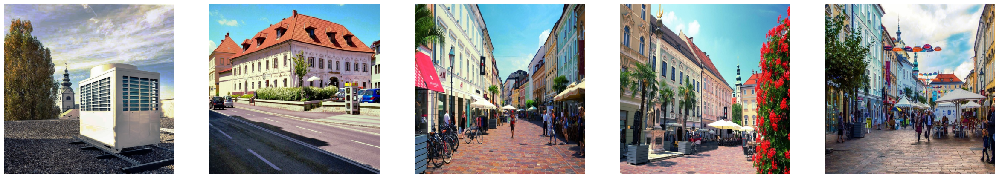

In [ ]:

photos_filenames = read_filenames(photos_path)
print('No. of images in jpg format:', len(photos_filenames))
display_image(5, 5, photos_filenames, figsize=(30, 30))

In [ ]:
# Display Content and Stye Image that Will go as input

def display_inputs(content_path, style_path):
  print(content_path, style_path)
  content_img = read_img(content_path)
  style_img = read_img(style_path)

  plt.subplot(1,2,1).set_title('Content Image'), plt.imshow(content_img),  plt.axis('off')
  plt.subplot(1,2,2).set_title('Style Image'), plt.imshow(style_img),  plt.axis('off')



/content/drive/MyDrive/small_proj/Klag/preprocessed_9.jpg /content/drive/MyDrive/small_proj/Udin/resized_my_udine_322728788_466821948986797_1732525540462196845_n.jpg


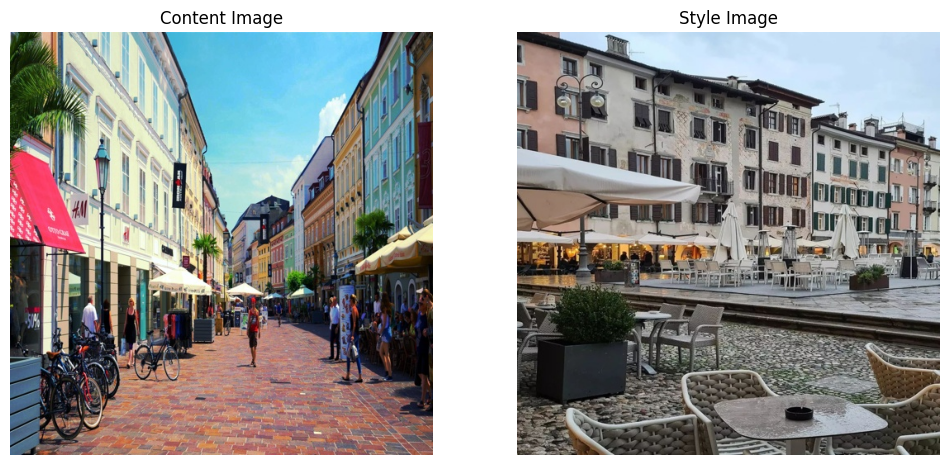

In [ ]:
display_inputs(photos_filenames[2], Artit_filenames[1])


In [ ]:
#Load Image
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]  # Add batch dimension
    return img


In [ ]:
# Tf reads images as tensor conatining batches of images, here we read image in batch of 1.
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [ ]:
content_image =load_img(photos_filenames[1])
style_image = load_img(Artit_filenames[2])

VGG19 is a image classification model, trained on Imagenet dataset. We are checking wether it can take out image.

In [ ]:
# Giving Content image as input to VGG19 for test run
x = tf.keras.applications.vgg19.preprocess_input(content_image*255)
x = tf.image.resize(x, (224, 224))

vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(x)
prediction_probabilities.shape

TensorShape([1, 1000])

In [ ]:
#VGG19 predictions
predicted_top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
[(class_name, prob) for (number, class_name, prob) in predicted_top_5]


[('patio', 0.27822867),
 ('palace', 0.16215368),
 ('fountain', 0.10576576),
 ('lakeside', 0.07390763),
 ('dock', 0.06832412)]

# Loading VGG19 without classification head

In [ ]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
# layers in VGG19
print()
for layer in vgg.layers:
  print(layer.name)


input_7
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


# Extracting Style

1. Select layrs of VGG19 whose output we want to use. (taking feature maps)
2. Calculating Gram Matrix Using these feature maps.


In [ ]:
#choosing intermediate layers
content_layers = ['block5_conv2']

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [ ]:
def vgg_layers(layer_names):
  """ Creates a VGG model that returns a list of intermediate output values."""
  # Load our model. Load pretrained VGG, trained on ImageNet data
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False

  outputs = [vgg.get_layer(name).output for name in layer_names]

  model = tf.keras.Model([vgg.input], outputs)
  return model

In [ ]:
style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

#Look at the statistics of each layer's output
for name, output in zip(style_layers, style_outputs):
  print(name)
  print("  shape: ", output.numpy().shape)
  print("  min: ", output.numpy().min())
  print("  max: ", output.numpy().max())
  print("  mean: ", output.numpy().mean())
  print()

block1_conv1
  shape:  (1, 512, 512, 64)
  min:  0.0
  max:  849.3258
  mean:  30.52282

block2_conv1
  shape:  (1, 256, 256, 128)
  min:  0.0
  max:  3914.5256
  mean:  179.30412

block3_conv1
  shape:  (1, 128, 128, 256)
  min:  0.0
  max:  8900.844
  mean:  180.82123

block4_conv1
  shape:  (1, 64, 64, 512)
  min:  0.0
  max:  19632.125
  mean:  667.1892

block5_conv1
  shape:  (1, 32, 32, 512)
  min:  0.0
  max:  2934.7976
  mean:  56.547485



In [ ]:
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

In [ ]:
# This returns gram matrix of style and content layers

class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Expects float input in [0,1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])

    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [ ]:
extractor = StyleContentModel(style_layers, content_layers)

results = extractor(tf.constant(content_image))

print('Styles:')
for name, output in sorted(results['style'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())
  print()

print("Contents:")
for name, output in sorted(results['content'].items()):
  print("  ", name)
  print("    shape: ", output.numpy().shape)
  print("    min: ", output.numpy().min())
  print("    max: ", output.numpy().max())
  print("    mean: ", output.numpy().mean())

Styles:
   block1_conv1
    shape:  (1, 64, 64)
    min:  0.11948894
    max:  25342.5
    mean:  681.2074

   block2_conv1
    shape:  (1, 128, 128)
    min:  0.0
    max:  182480.23
    mean:  25003.059

   block3_conv1
    shape:  (1, 256, 256)
    min:  0.08449846
    max:  429802.1
    mean:  23619.629

   block4_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  5275923.5
    mean:  336201.25

   block5_conv1
    shape:  (1, 512, 512)
    min:  0.0
    max:  284253.16
    mean:  2889.8594

Contents:
   block5_conv2
    shape:  (1, 32, 32, 512)
    min:  0.0
    max:  1464.7369
    mean:  20.34753


# Run gradient descent
With this style and content extractor, you can now implement the style transfer algorithm. Do this by calculating the mean square error for your image's output relative to each target, then take the weighted sum of these losses.

Set your style and content target values:

In [ ]:
style_targets = extractor(style_image)['style']
content_targets = extractor(content_image)['content']

In [ ]:
image = tf.Variable(content_image)

In [ ]:
#Normalization
def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

In [ ]:
style_weight=1e-2
content_weight=1e4

In [ ]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2)
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2)
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [ ]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

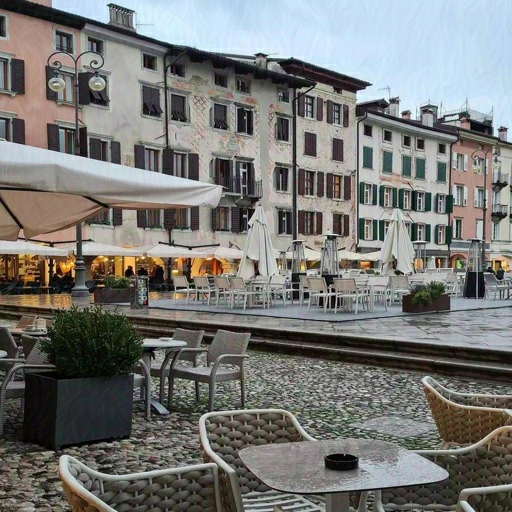

In [ ]:
# First few steps of optimization
train_step(image)
train_step(image)
train_step(image)
tensor_to_image(image)

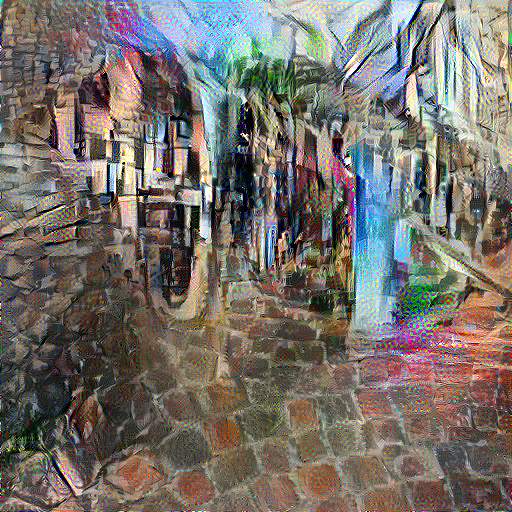

Train step: 5000
Total time: 454.3


In [ ]:
import time
start = time.time()

epochs = 50
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

# Total variation loss

One downside to this basic implementation is that it produces a lot of high frequency artifacts. Decrease these using an explicit regularization term on the high frequency components of the image. In style transfer, this is often called the total variation loss:



In [ ]:
def high_pass_x_y(image):
  x_var = image[:, :, 1:, :] - image[:, :, :-1, :]
  y_var = image[:, 1:, :, :] - image[:, :-1, :, :]

  return x_var, y_var

(-0.5, 510.5, 511.5, -0.5)

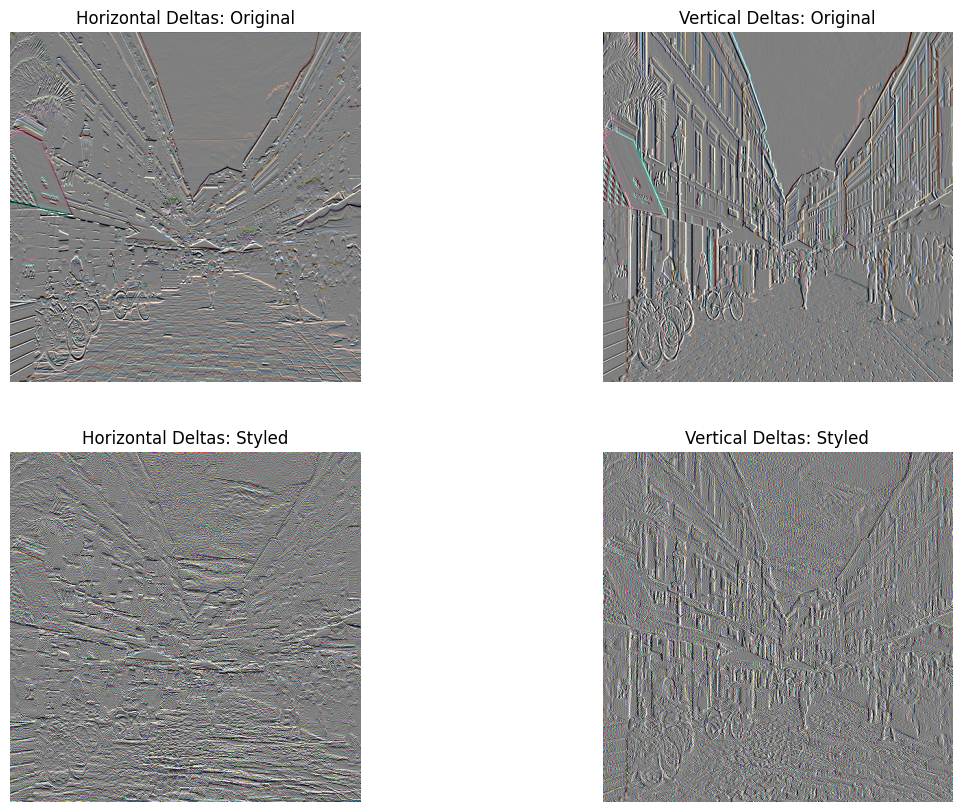

In [ ]:
x_deltas, y_deltas = high_pass_x_y(content_image)
from matplotlib.pyplot import *


plt.figure(figsize=(14, 10))
plt.subplot(2, 2, 1).set_title("Horizontal Deltas: Original")
i = clip_0_1(2*y_deltas+0.5)[0]
plt.imshow(i)
plt.axis('off')

plt.subplot(2, 2, 2).set_title("Vertical Deltas: Original")
i = clip_0_1(2*x_deltas+0.5)[0]
plt.imshow(i)
plt.axis('off')

x_deltas, y_deltas = high_pass_x_y(image)

plt.subplot(2, 2, 3).set_title("Horizontal Deltas: Styled")
i = clip_0_1(2*y_deltas+0.5)[0]
plt.imshow(i)
plt.axis('off')

plt.subplot(2, 2, 4).set_title("Vertical Deltas: Styled")
i = clip_0_1(2*x_deltas+0.5)[0]
plt.imshow(i)
plt.axis('off')

(-0.5, 511.5, 511.5, -0.5)

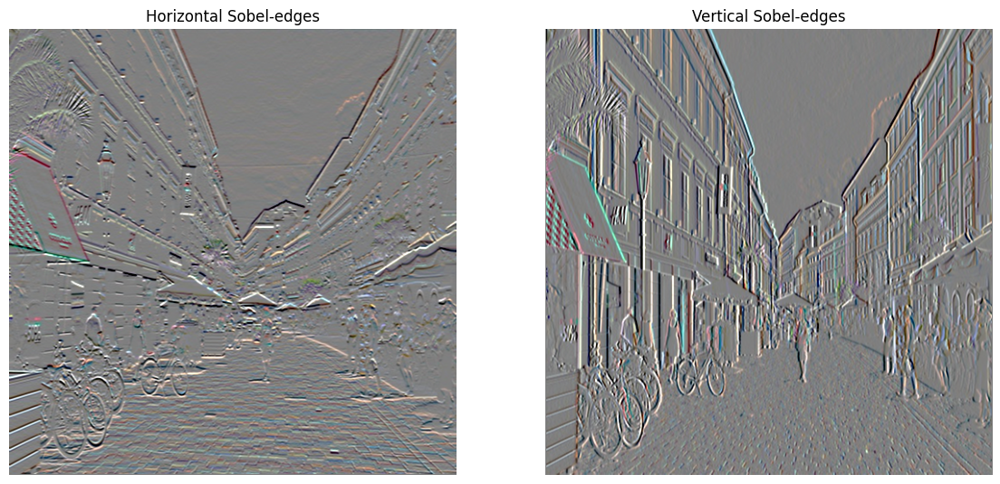

In [ ]:
#doing same using sobel
plt.figure(figsize=(14, 10))

sobel = tf.image.sobel_edges(content_image)
plt.subplot(1, 2, 1).set_title("Horizontal Sobel-edges")
i = clip_0_1(sobel[..., 0]/4+0.5)[0]
plt.imshow(i)
plt.axis('off')


plt.subplot(1, 2, 2).set_title( "Vertical Sobel-edges")
i = clip_0_1(sobel[..., 1]/4+0.5)[0]
plt.imshow(i)
plt.axis('off')

In [ ]:
def total_variation_loss(image):
  x_deltas, y_deltas = high_pass_x_y(image)
  return tf.reduce_sum(tf.abs(x_deltas)) + tf.reduce_sum(tf.abs(y_deltas))

In [ ]:
total_variation_loss(image).numpy()

220583.22

# Running Optimization Again

In [ ]:
total_variation_weight=30

In [ ]:
@tf.function()
def train_step(image):
  with tf.GradientTape() as tape:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    loss += total_variation_weight*tf.image.total_variation(image)

  grad = tape.gradient(loss, image)
  opt.apply_gradients([(grad, image)])
  image.assign(clip_0_1(image))

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
image = tf.Variable(content_image)

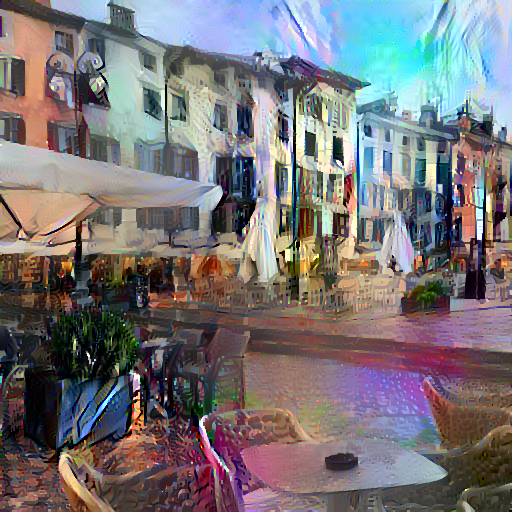

Train step: 5000
Total time: 460.9


In [ ]:
import time
start = time.time()

epochs = 50
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image)
    print(".", end='', flush=True)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

end = time.time()
print("Total time: {:.1f}".format(end-start))

In [ ]:
file_name = 'stylized-image.png'
tensor_to_image(image).save(file_name)

try:
  from google.colab import files
except ImportError:
   pass
else:
  files.download(file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>